<a href="https://colab.research.google.com/github/emmelinetsen/deep_learning/blob/master/dl-w-pytorch/Chapter2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
# using GPU, expect cuda to be available
torch.cuda.is_available()

True

In [0]:
a = [1.0, 2.0, 1.0]

In [3]:
# access first element of the list 
a[0]

1.0

In [0]:
a[2] = 3.0

In [7]:
a

[1.0, 2.0, 3.0]

In [9]:
# using PyTorch
a = torch.ones(3)
a

tensor([1., 1., 1.])

In [10]:
a[1]

tensor(1.)

In [11]:
float(a[1])

1.0

In [12]:
a[2] = 2
a

tensor([1., 1., 2.])

In [14]:
points = torch.zeros(6)
points[0] = 1.0
points[1] = 4.0
points[2] = 2.0
points[3] = 1.0
points[4] = 3.0
points[5] = 5.0
points

tensor([1., 4., 2., 1., 3., 5.])

In [15]:
float(points[0]), float(points[1])

(1.0, 4.0)

In [16]:
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
points

tensor([[1., 4.],
        [2., 1.],
        [3., 5.]])

In [17]:
points.shape

torch.Size([3, 2])

In [18]:
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
points_storage = points.storage()
points_storage[0] = 2.0
points

tensor([[2., 4.],
        [2., 1.],
        [3., 5.]])

In [25]:
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1]
second_point.storage_offset()

2

In [20]:
second_point.size()

torch.Size([2])

In [24]:
# get the stride
points.stride()

(2, 1)

In [26]:
second_point.stride()

(1,)

In [27]:
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1]
second_point[0] = 10.0
points

tensor([[ 1.,  4.],
        [10.,  1.],
        [ 3.,  5.]])

In [7]:
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1].clone()
second_point[0] = 10.0
points

tensor([[1., 4.],
        [2., 1.],
        [3., 5.]])

In [33]:
double_points = torch.ones(10, 2, dtype=torch.double)
short_points = torch.tensor([[1, 2], [3, 4]], dtype=torch.short)
short_points

tensor([[1, 2],
        [3, 4]], dtype=torch.int16)

In [0]:
# moving tensor to gpu
points_gpu = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 4.0]],  device='cuda')
points_gpu = points.to(device='cuda')

In [8]:
points = 2 * points # performed on cpu
points_gpu = 2 * points.to(device='cuda') # performed on gpu
points_gpu

tensor([[ 4., 16.],
        [ 8.,  4.],
        [12., 20.]], device='cuda:0')

Using pre trained networks for dog classification

In [1]:
from torchvision import models
dir(models)

['AlexNet',
 'DenseNet',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'Inception3',
 'InceptionOutputs',
 'MNASNet',
 'MobileNetV2',
 'ResNet',
 'ShuffleNetV2',
 'SqueezeNet',
 'VGG',
 '_GoogLeNetOutputs',
 '_InceptionOutputs',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '_utils',
 'alexnet',
 'densenet',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'detection',
 'googlenet',
 'inception',
 'inception_v3',
 'mnasnet',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet',
 'mobilenet_v2',
 'quantization',
 'resnet',
 'resnet101',
 'resnet152',
 'resnet18',
 'resnet34',
 'resnet50',
 'resnext101_32x8d',
 'resnext50_32x4d',
 'segmentation',
 'shufflenet_v2_x0_5',
 'shufflenet_v2_x1_0',
 'shufflenet_v2_x1_5',
 'shufflenet_v2_x2_0',
 'shufflenetv2',
 'squeezenet',
 'squeezenet1_0',
 'squeezenet1_1',
 'utils',
 'vgg',
 'vgg11',
 'vgg11_bn',
 'vgg13',
 'vgg13_bn',
 'vgg16',
 'vg

In [3]:
vgg16 = models.vgg16(pretrained=True)
vgg16

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [0]:
from torchvision import transforms
transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )])

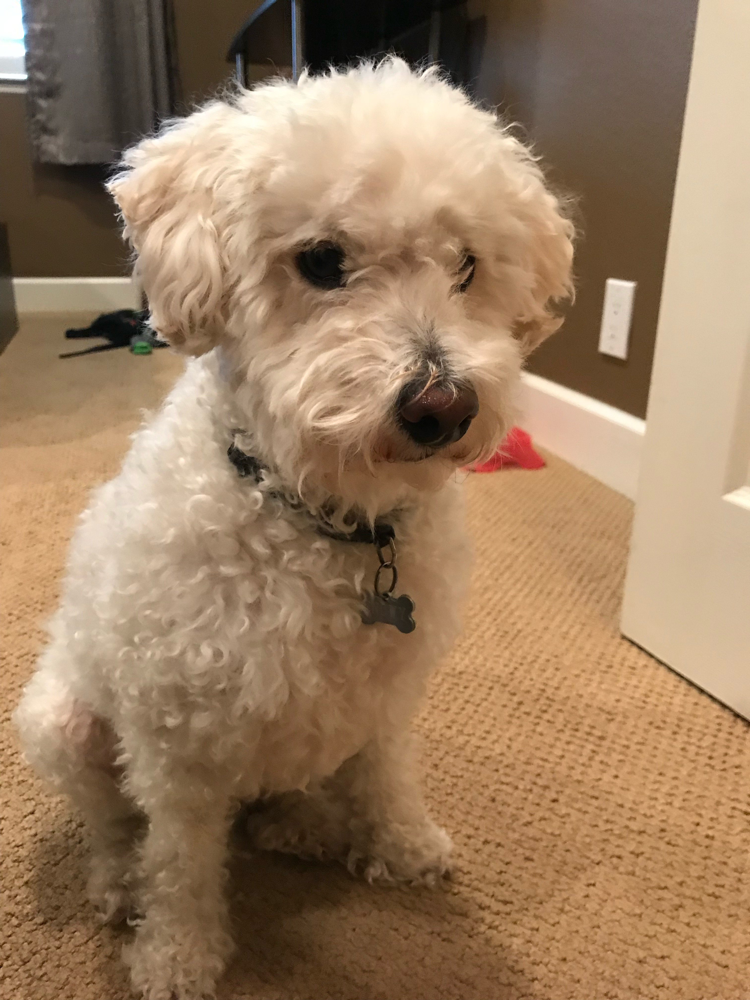

In [7]:
from PIL import Image
img = Image.open("/content/Cloudy.jpg")
img

In [8]:
img = transform(img)
img

tensor([[[-1.4329, -1.4672, -1.4843,  ...,  1.7352,  1.7352,  1.7352],
         [-1.3987, -1.4158, -1.4500,  ...,  1.7352,  1.7352,  1.7352],
         [-1.2959, -1.3302, -1.3644,  ...,  1.7352,  1.7352,  1.7180],
         ...,
         [ 0.6563,  0.6392,  0.4166,  ...,  1.4098,  1.3413,  1.2728],
         [ 0.5364,  0.5193,  0.3309,  ...,  0.8104,  0.7077,  1.2899],
         [ 0.5878,  0.4679,  0.3823,  ...,  0.6049,  0.5707,  1.1529]],

        [[-1.4580, -1.4930, -1.5105,  ...,  1.5707,  1.5707,  1.5707],
         [-1.4230, -1.4580, -1.4755,  ...,  1.5707,  1.5707,  1.5707],
         [-1.3704, -1.4055, -1.4230,  ...,  1.5707,  1.5707,  1.5532],
         ...,
         [ 0.1702,  0.1877, -0.0224,  ...,  0.6779,  0.6078,  0.5553],
         [ 0.0476,  0.0651, -0.0924,  ...,  0.0651, -0.0224,  0.5728],
         [ 0.0826, -0.0224, -0.0399,  ..., -0.1275, -0.1450,  0.4328]],

        [[-1.3861, -1.4210, -1.4210,  ...,  1.2631,  1.2631,  1.2631],
         [-1.3513, -1.3861, -1.3861,  ...,  1

In [9]:
import torch
batch_t = torch.unsqueeze(img, 0)
vgg16.eval()


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [10]:
out = vgg16(batch_t)
out

tensor([[-2.9739e+00, -1.9206e-01, -2.0636e+00, -4.0476e+00, -2.1164e+00,
         -1.6563e+00, -2.6764e+00,  8.6703e-01,  1.6022e+00, -3.3753e+00,
         -3.7674e+00, -2.7581e+00, -4.1902e+00, -4.5572e+00, -2.8258e+00,
         -3.4688e+00, -2.8052e+00, -2.3148e+00, -2.5581e+00, -1.5910e+00,
         -2.6195e+00, -3.3730e+00, -3.8288e+00, -2.9150e+00, -3.0334e+00,
         -1.9132e+00, -2.3815e+00, -1.5004e+00, -1.7225e+00, -1.8745e-01,
         -2.5536e+00, -3.1230e-01, -7.3896e-01,  9.4120e-01,  1.4771e+00,
         -1.4622e+00,  2.4528e-01, -1.6833e+00, -1.1108e+00, -9.1987e-01,
         -2.0536e+00, -1.4071e+00, -2.3022e+00, -2.3109e+00, -3.5249e+00,
          3.9368e-01,  3.1863e-02, -1.5209e+00, -6.0794e-01, -2.5591e+00,
         -2.4341e+00, -8.7626e-02, -1.1432e+00, -2.9003e+00, -1.8009e+00,
         -7.4685e-01, -2.7636e-01, -3.3891e+00, -2.7559e+00, -2.0001e+00,
         -1.8324e+00, -2.5980e+00, -3.3357e+00, -1.8460e+00, -6.3510e-01,
         -9.4915e-01,  2.1230e-03, -2.

In [0]:
with open('/content/imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

In [0]:
_, index = torch.max(out, 1)

In [14]:
percent = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percent[index[0]].item()

('Maltese dog, Maltese terrier, Maltese', 48.64362335205078)

In [17]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percent[idx].item()) for idx in indices[0][:5]]

[('Maltese dog, Maltese terrier, Maltese', 48.64362335205078),
 ('toy poodle', 30.568897247314453),
 ('miniature poodle', 17.235244750976562),
 ('Lhasa, Lhasa apso', 0.7852902412414551),
 ('West Highland white terrier', 0.3645452558994293)]